# OF-driven Gaussian denoising

In [1]:
!which python

/shared/PEs/farneback-python/bin/python


In [2]:
#!pip install --upgrade pip

In [3]:
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
from ipywidgets import *
import cv2
import time
#import kernels
#import _2D_OF_denoising2 as _2D_OF_denoising
import logging

In [4]:
!pip uninstall -y "image_denoising @ git+https://github.com/microscopy-processing/image_denoising"

In [5]:
# Run this cell if image_denoising is available as a package

#!pip install "image_denoising @ git+https://github.com/microscopy-processing/image_denoising"
#!pip show image_denoising
#import image_denoising

In [6]:
try:
    from image_IO import image_1 as gray_image
    from image_IO import image_3 as RGB_image
except:
    !pip install "image_IO @ git+https://github.com/vicente-gonzalez-ruiz/image_IO"
    from image_IO import image_1 as gray_image
    from image_IO import image_3 as RGB_image

In [7]:
!rm barb.png.?
!wget http://www.hpca.ual.es/~vruiz/images/barb.png

--2023-08-02 12:38:40--  http://www.hpca.ual.es/~vruiz/images/barb.png
Resolving www.hpca.ual.es (www.hpca.ual.es)... 150.214.150.42
Connecting to www.hpca.ual.es (www.hpca.ual.es)|150.214.150.42|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 232140 (227K) [image/png]
Saving to: ‘barb.png.1’

barb.png.1          100%[===================>] 226,70K  1,02MB/s    in 0,2s    

2023-08-02 12:38:40 (1,02 MB/s) - ‘barb.png.1’ saved [232140/232140]



In [8]:
img = gray_image.read("barb.png")

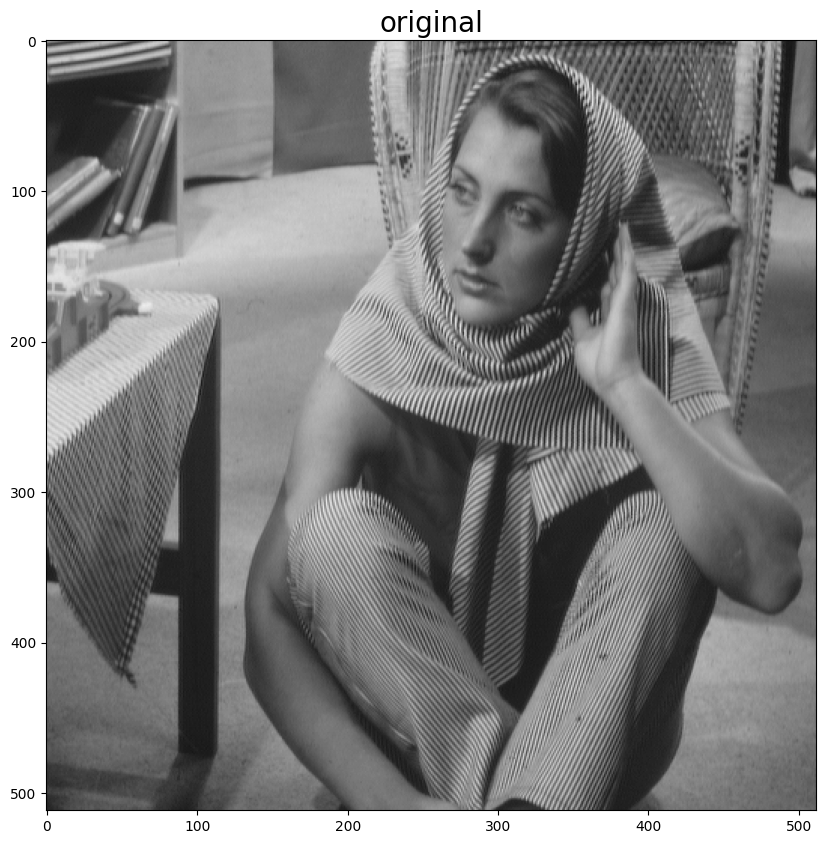

In [9]:
gray_image.show(img, "original")

In [10]:
mean = 0
var = 200
sigma = var**0.5
noise = np.random.normal(mean,sigma,img.shape).reshape(img.shape)
noisy_img = np.clip((img + noise), 0, 255).astype(np.uint8)

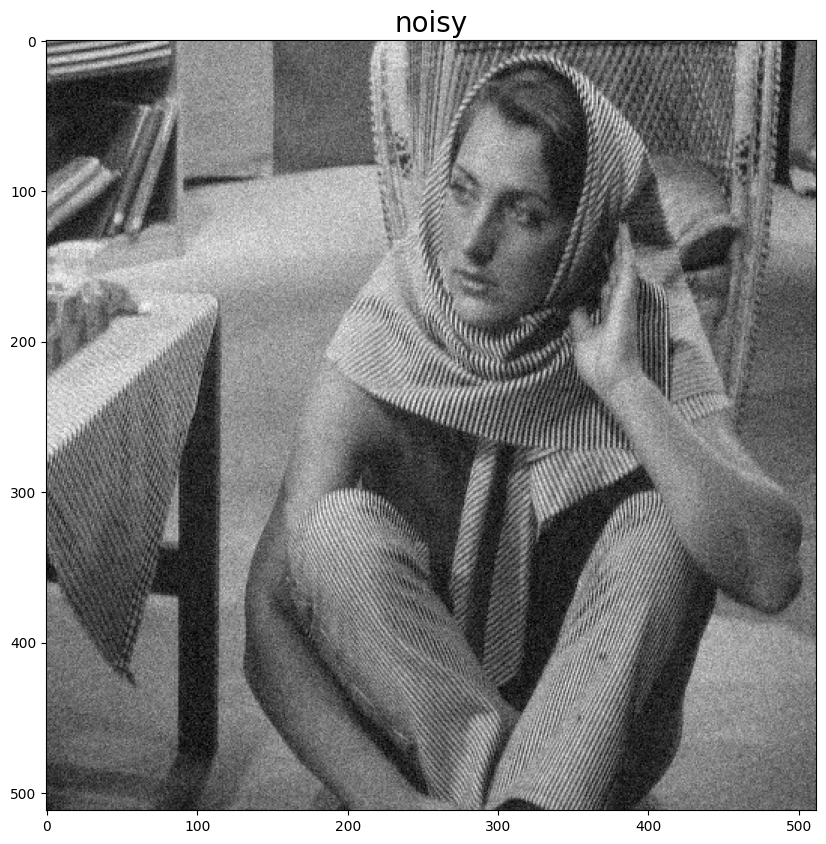

In [11]:
gray_image.show(noisy_img, "noisy")

## Gaussian

In [12]:
import image_denoising
from image_denoising import gaussian
image_denoising.gaussian.logger.setLevel(logging.WARNING)
logging.getLevelName(image_denoising.gaussian.logger.getEffectiveLevel())

'WARNING'

In [13]:
%%time

GD__N_iters = 1
GD__sigma = 2.5

denoised, _ = image_denoising.gaussian.filter_gray_image(noisy_img, GD__sigma, GD__N_iters)


CPU times: user 48.2 ms, sys: 52 µs, total: 48.3 ms
Wall time: 47.9 ms


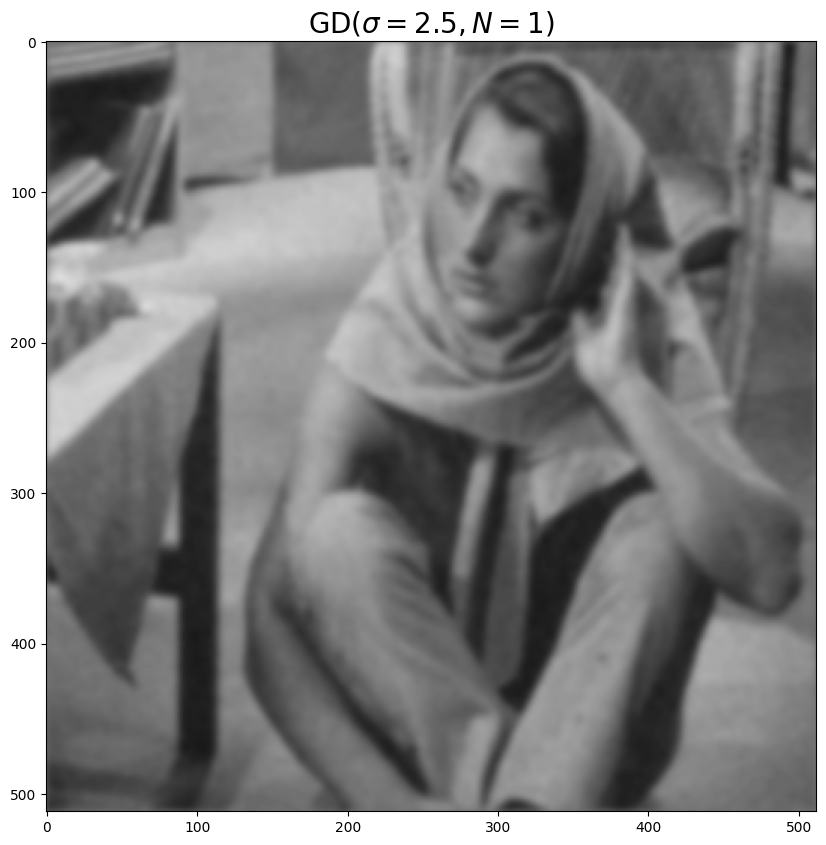

In [14]:
gray_image.show(denoised, "GD" + "($\sigma=" + f"{GD__sigma}, N={GD__N_iters}$)")

## OF-driven Gaussian

In [15]:
import image_denoising
from image_denoising import OF_gaussian
image_denoising.OF_gaussian.logger.setLevel(logging.WARNING)
logging.getLevelName(image_denoising.OF_gaussian.logger.getEffectiveLevel())

'WARNING'

In [16]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 1
OFGD__w = 9
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

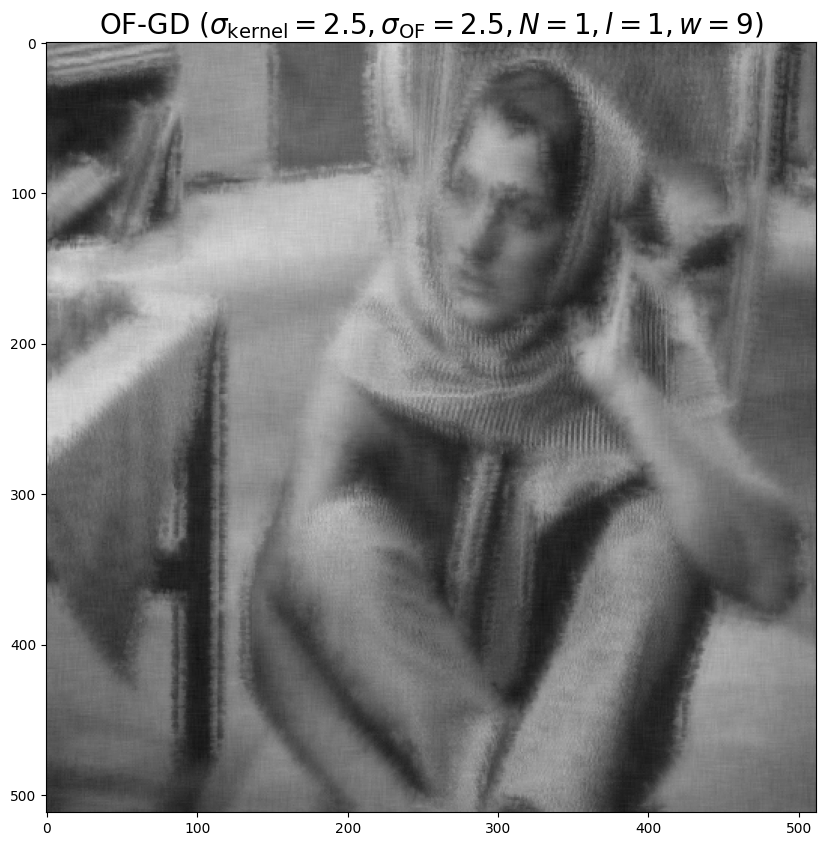

In [17]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [18]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 3
OFGD__l = 1
OFGD__w = 9
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

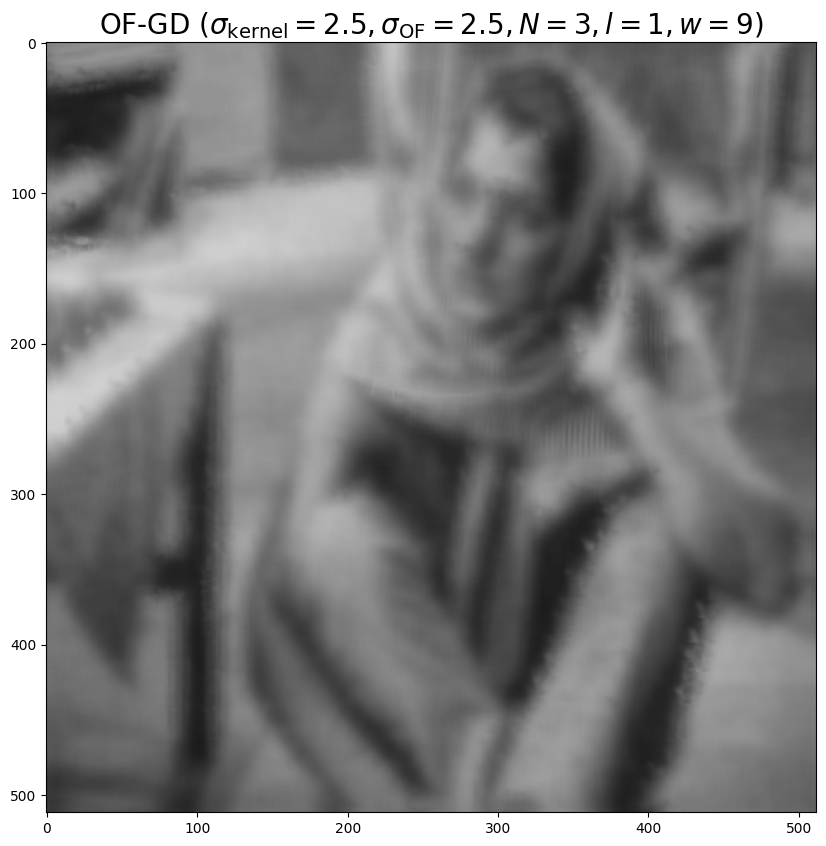

In [19]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [20]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 9
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

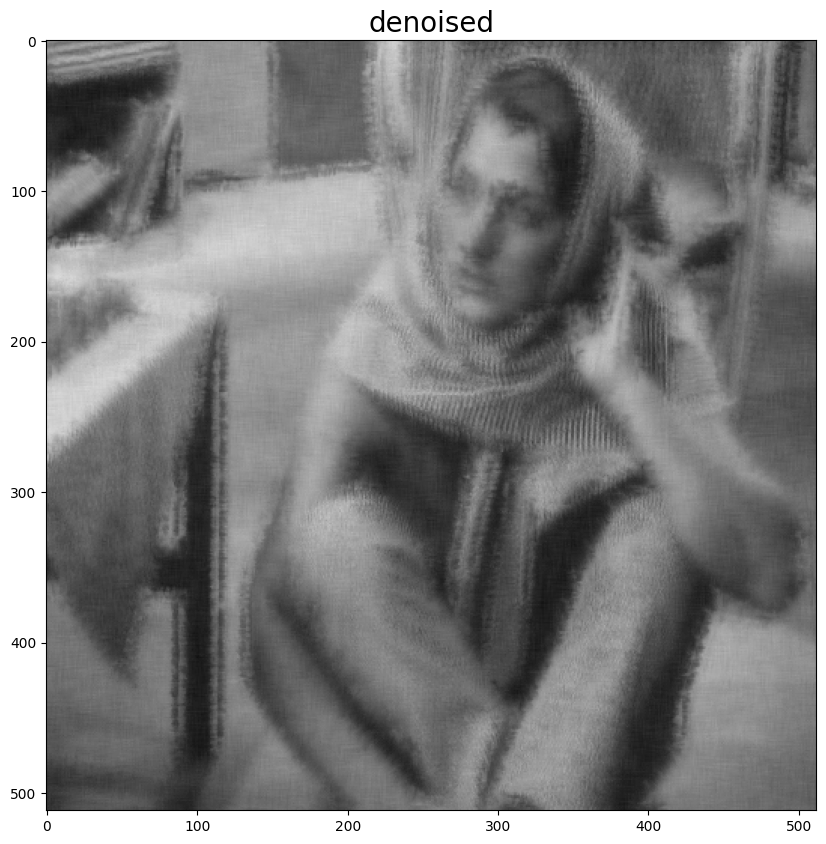

In [21]:
gray_image.show(denoised, "denoised")

In [22]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 33
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

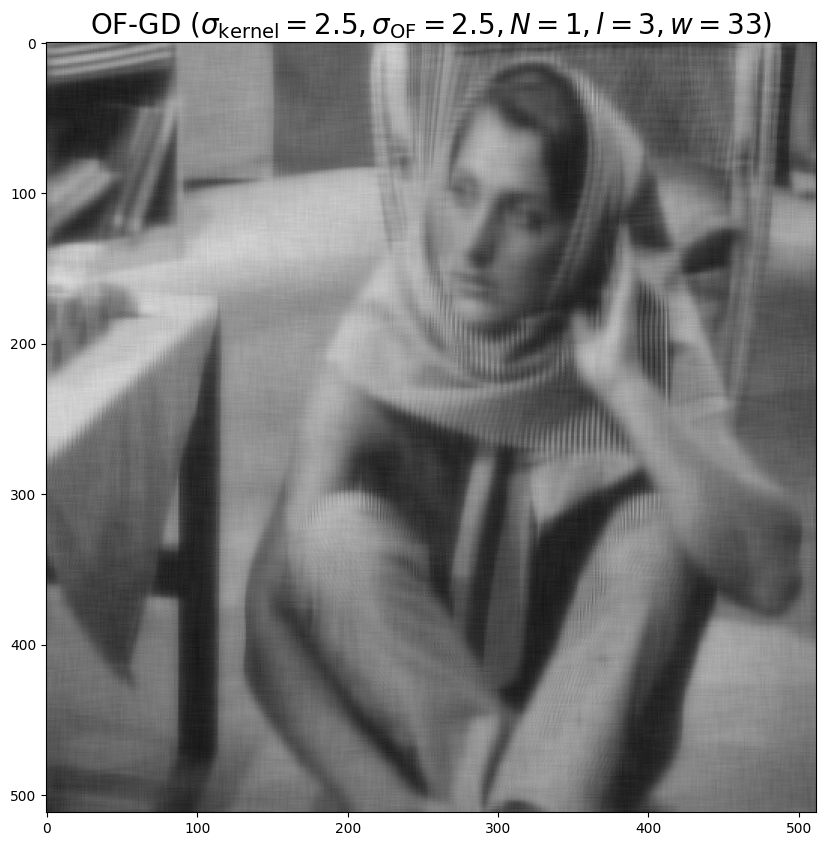

In [23]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [24]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 33
OFGD__sigma_OF = 0.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

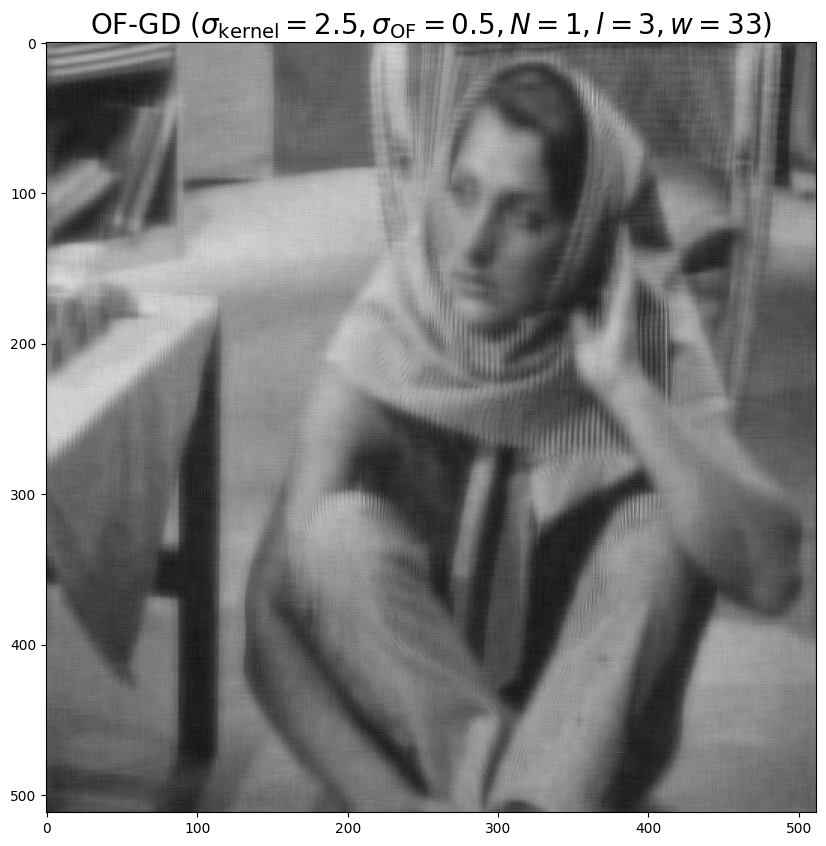

In [25]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [26]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 33
OFGD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

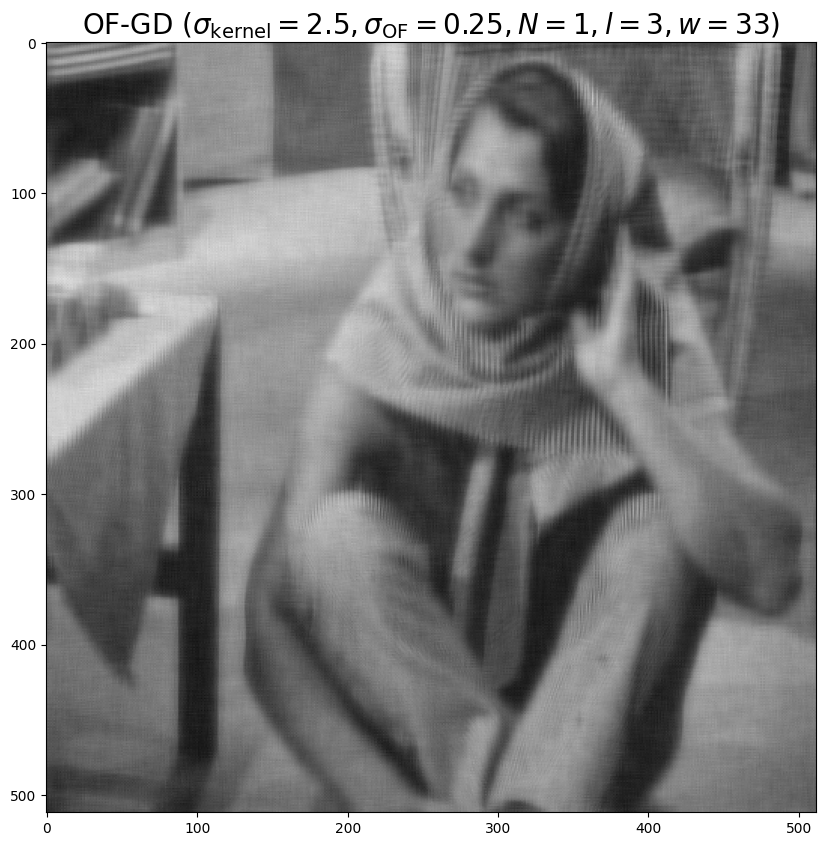

In [27]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [28]:
%%time

OFGD__sigma_kernel = 2.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 17
OFGD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

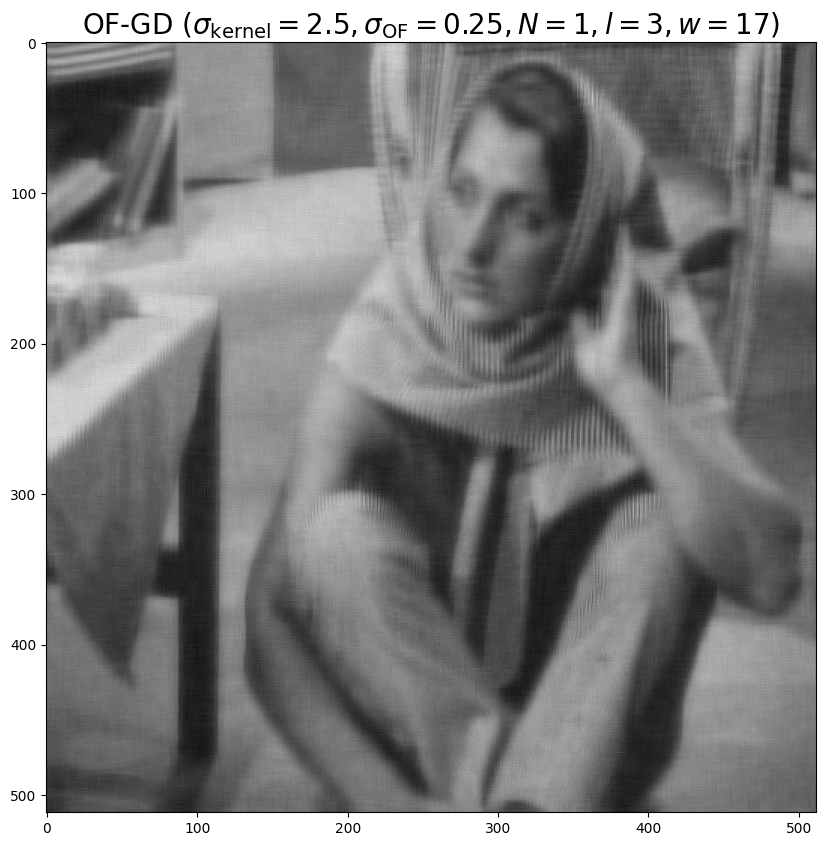

In [29]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [30]:
%%time

OFGD__sigma_kernel = 0.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 17
OFGD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

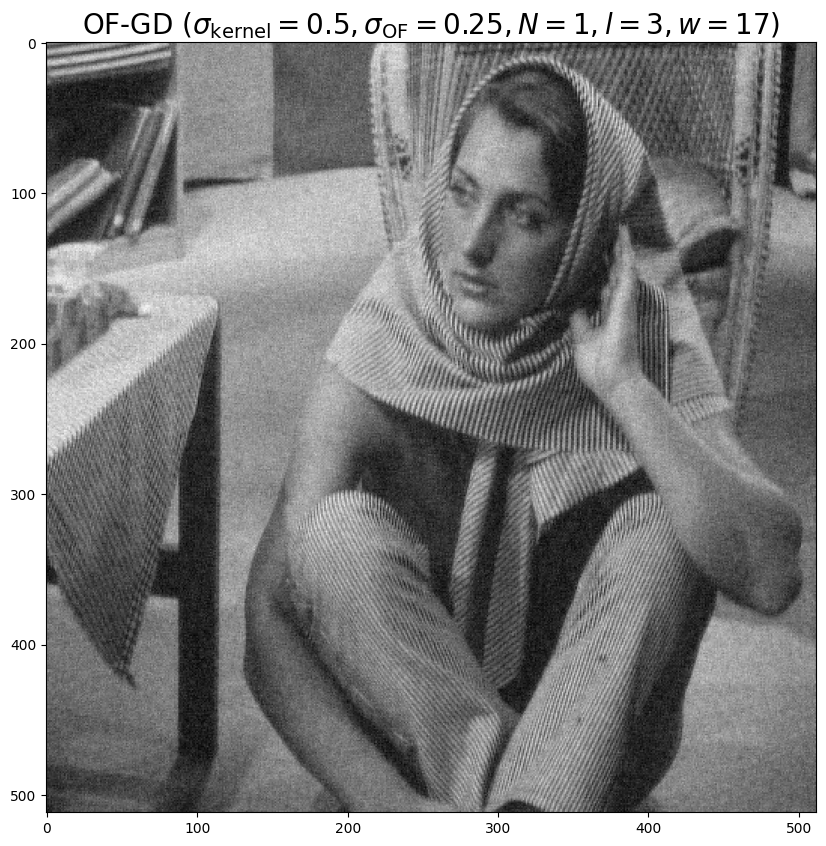

In [31]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [32]:
%%time

OFGD__sigma_kernel = 0.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 17
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

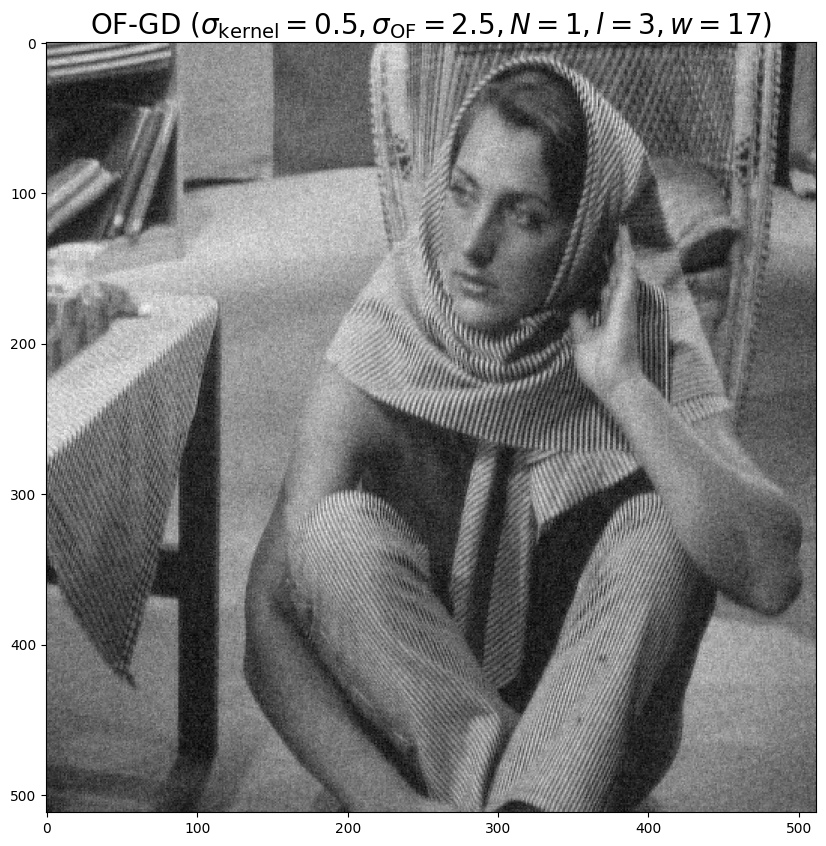

In [33]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [34]:
%%time

OFGD__sigma_kernel = 0.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 7
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

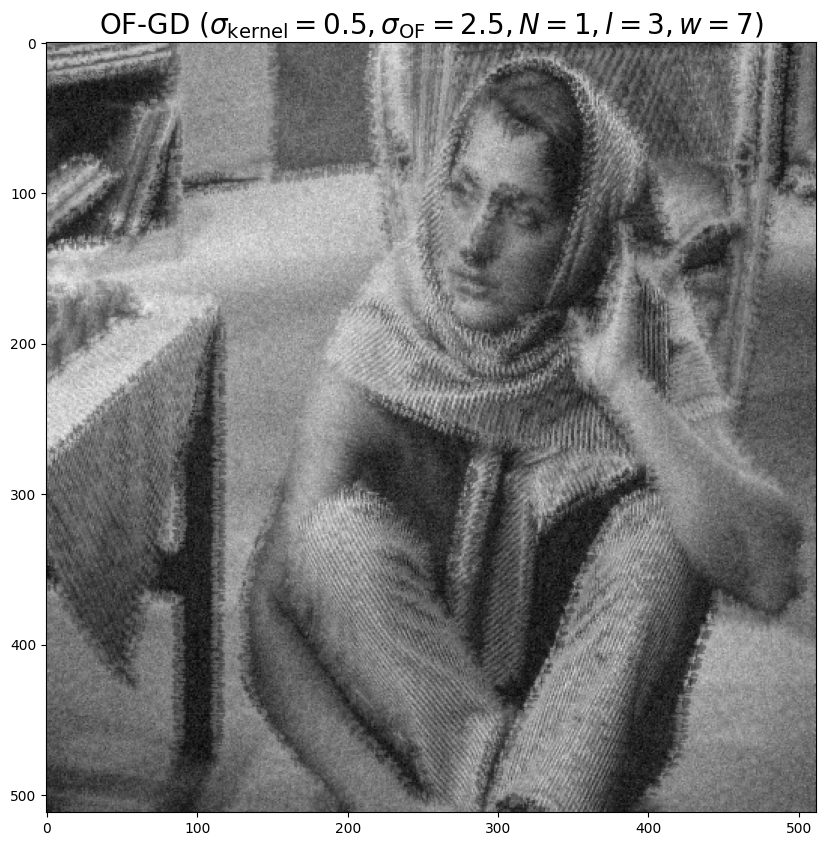

In [35]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

In [36]:
%%time

OFGD__sigma_kernel = 3.5
OFGD__N_iters = 1
OFGD__l = 3
OFGD__w = 15
OFGD__sigma_OF = 2.5

denoised, _ = image_denoising.OF_gaussian.filter_gray_image(noisy_img, OFGD__sigma_kernel, OFGD__N_iters, OFGD__l, OFGD__w, OFGD__sigma_OF)

v3
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276

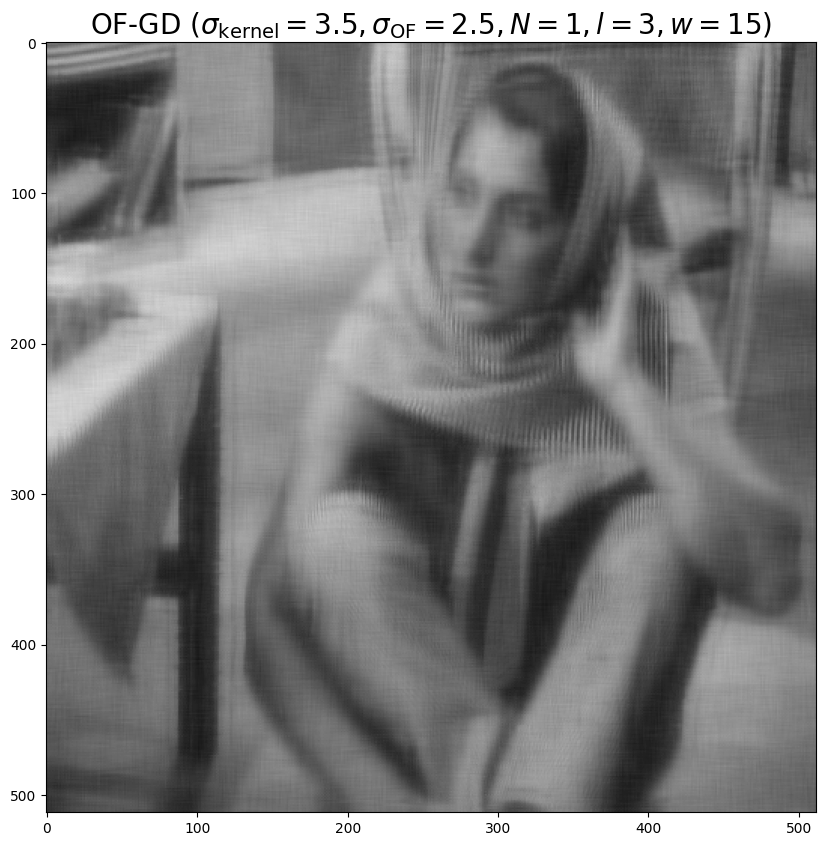

In [37]:
gray_image.show(denoised, "OF-GD " + "($\sigma_\mathrm{kernel}=" + f"{OFGD__sigma_kernel}"  + ", \sigma_\mathrm{OF}=" + f"{OFGD__sigma_OF}" + f", N={OFGD__N_iters}, l={OFGD__l}, w={OFGD__w}$)")

## OF-driven Random

In [38]:
import image_denoising
from image_denoising import OF_random
image_denoising.OF_random.logger.setLevel(logging.WARNING)
logging.getLevelName(image_denoising.OF_random.logger.getEffectiveLevel())

'WARNING'

In [39]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 1.0
OFRD__l = 3
OFRD__w = 11
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.77 s, sys: 293 ms, total: 4.06 s
Wall time: 3.53 s


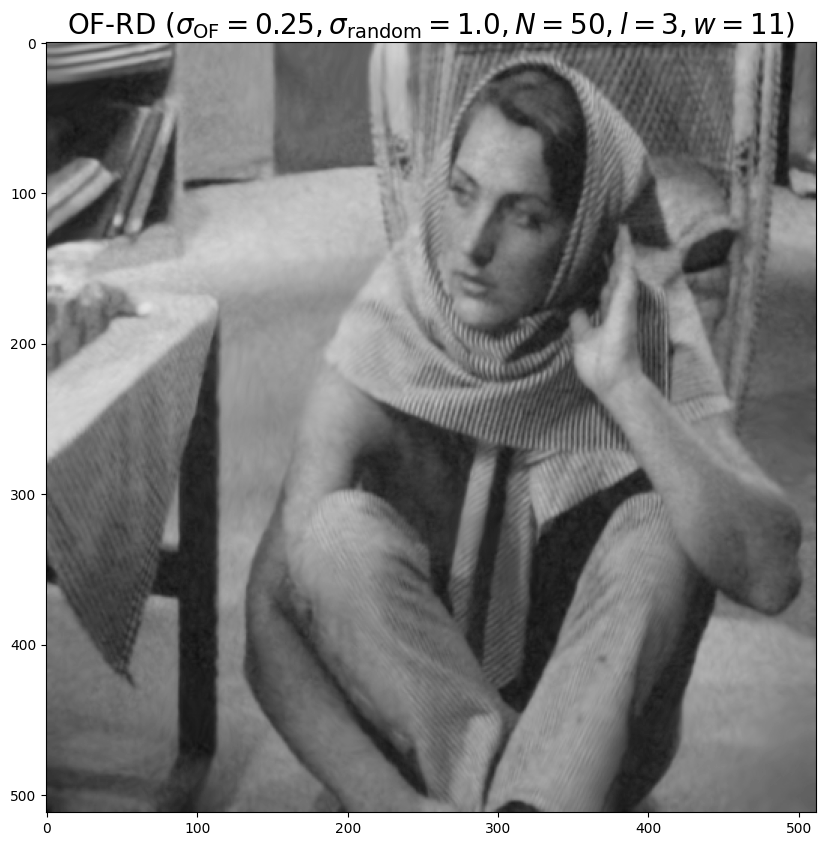

In [40]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [41]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 1.0
OFRD__l = 3
OFRD__w = 11
OFRD__sigma_OF = 1.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.88 s, sys: 155 ms, total: 4.03 s
Wall time: 3.51 s


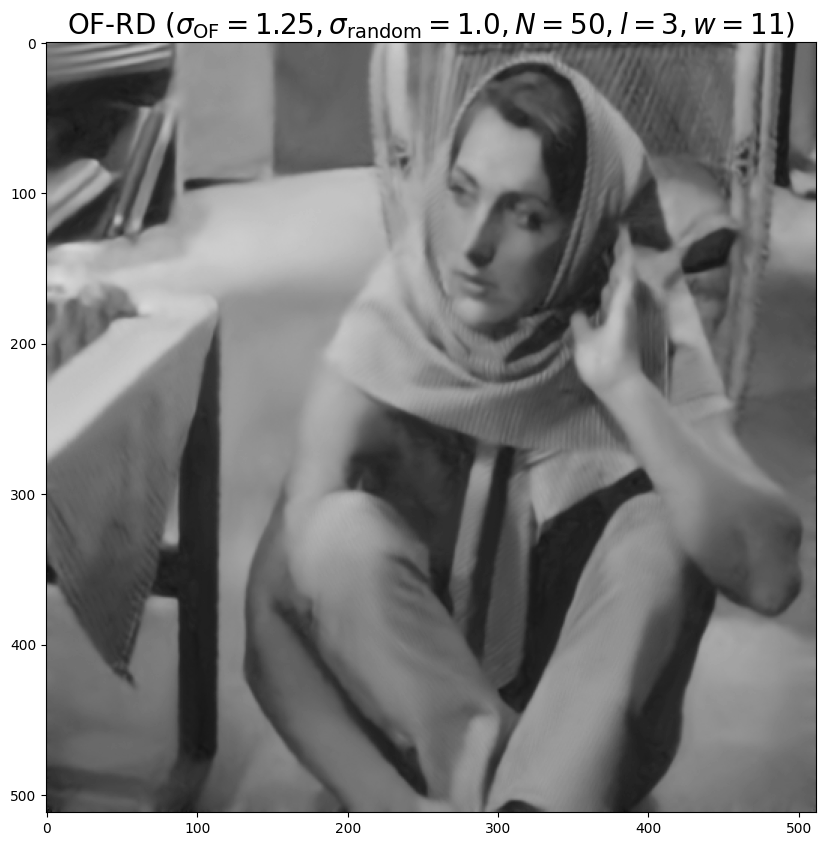

In [42]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [43]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 0.5
OFRD__l = 3
OFRD__w = 11
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.84 s, sys: 156 ms, total: 4 s
Wall time: 3.47 s


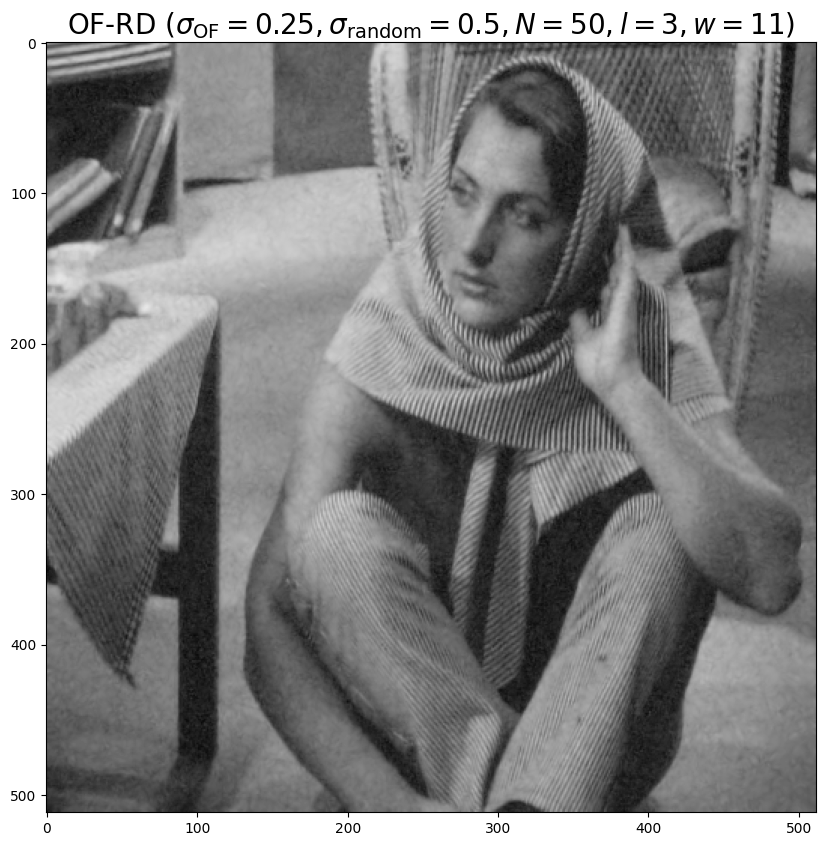

In [44]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [45]:
%%time

OFRD__N_iters = 100
OFRD__sigma_random = 0.5
OFRD__l = 3
OFRD__w = 11
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/100 1/100 2/100 3/100 4/100 5/100 6/100 7/100 8/100 9/100 10/100 11/100 12/100 13/100 14/100 15/100 16/100 17/100 18/100 19/100 20/100 21/100 22/100 23/100 24/100 25/100 26/100 27/100 28/100 29/100 30/100 31/100 32/100 33/100 34/100 35/100 36/100 37/100 38/100 39/100 40/100 41/100 42/100 43/100 44/100 45/100 46/100 47/100 48/100 49/100 50/100 51/100 52/100 53/100 54/100 55/100 56/100 57/100 58/100 59/100 60/100 61/100 62/100 63/100 64/100 65/100 66/100 67/100 68/100 69/100 70/100 71/100 72/100 73/100 74/100 75/100 76/100 77/100 78/100 79/100 80/100 81/100 82/100 83/100 84/100 85/100 86/100 87/100 88/100 89/100 90/100 91/100 92/100 93/100 94/100 95/100 96/100 97/100 98/100 99/100 
CPU times: user 7.37 s, sys: 605 ms, total: 7.97 s
Wall time: 6.92 s


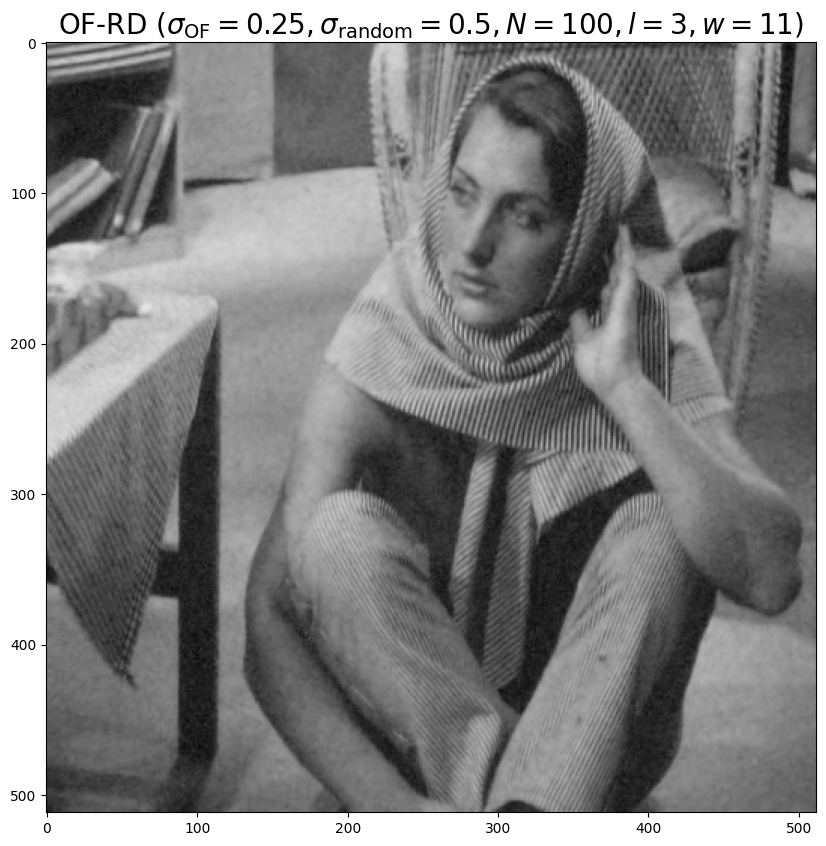

In [46]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [47]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 1.0
OFRD__l = 3
OFRD__w = 3
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.34 s, sys: 575 ms, total: 3.92 s
Wall time: 3.37 s


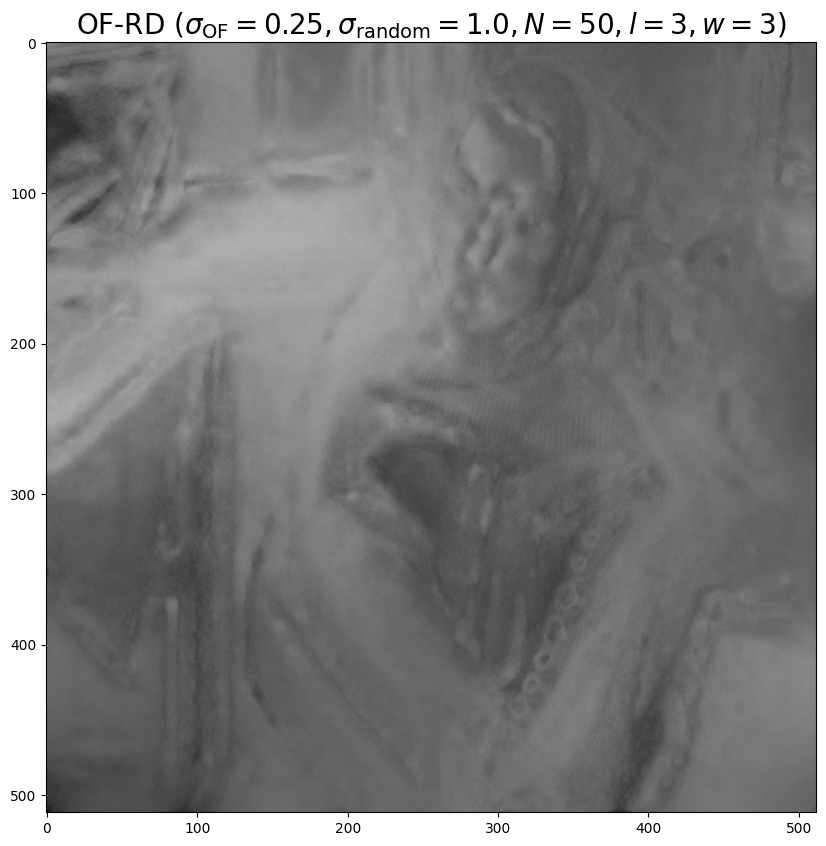

In [48]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [49]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 3
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.26 s, sys: 580 ms, total: 3.84 s
Wall time: 3.31 s


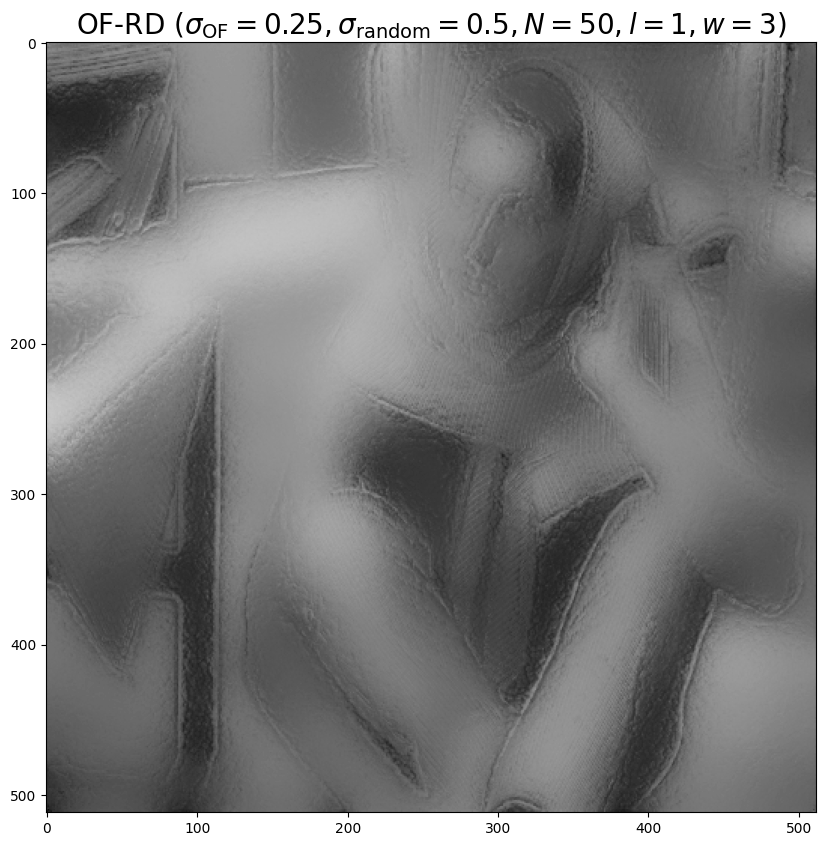

In [50]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [51]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 5
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.43 s, sys: 454 ms, total: 3.88 s
Wall time: 3.35 s


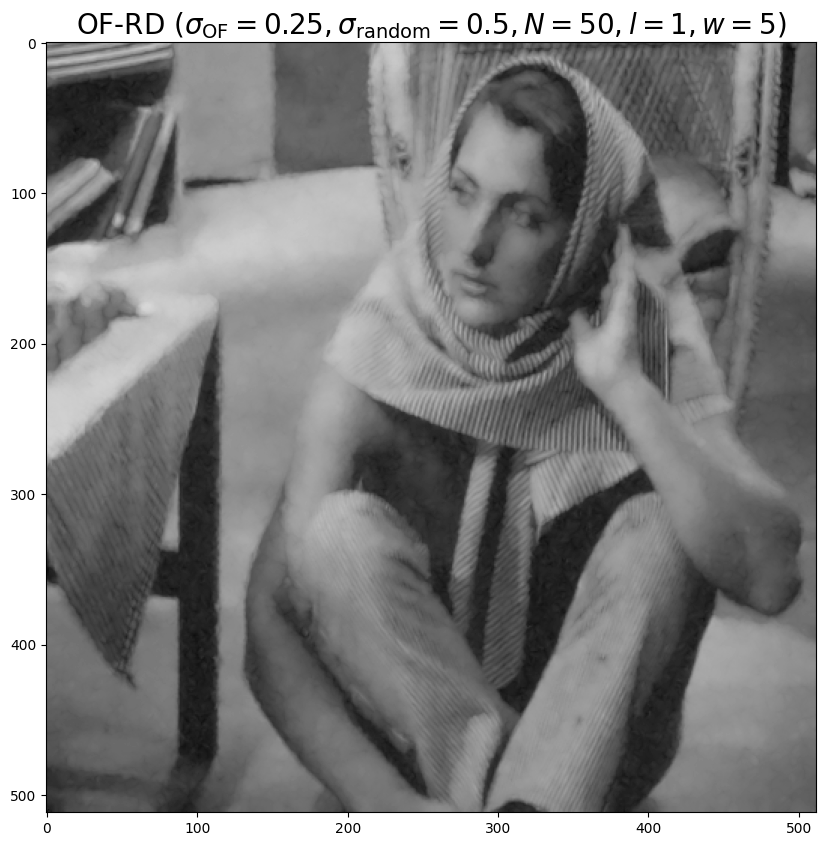

In [52]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [53]:
%%time

OFRD__N_iters = 50
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 17
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/50 1/50 2/50 3/50 4/50 5/50 6/50 7/50 8/50 9/50 10/50 11/50 12/50 13/50 14/50 15/50 16/50 17/50 18/50 19/50 20/50 21/50 22/50 23/50 24/50 25/50 26/50 27/50 28/50 29/50 30/50 31/50 32/50 33/50 34/50 35/50 36/50 37/50 38/50 39/50 40/50 41/50 42/50 43/50 44/50 45/50 46/50 47/50 48/50 49/50 
CPU times: user 3.78 s, sys: 591 ms, total: 4.37 s
Wall time: 3.82 s


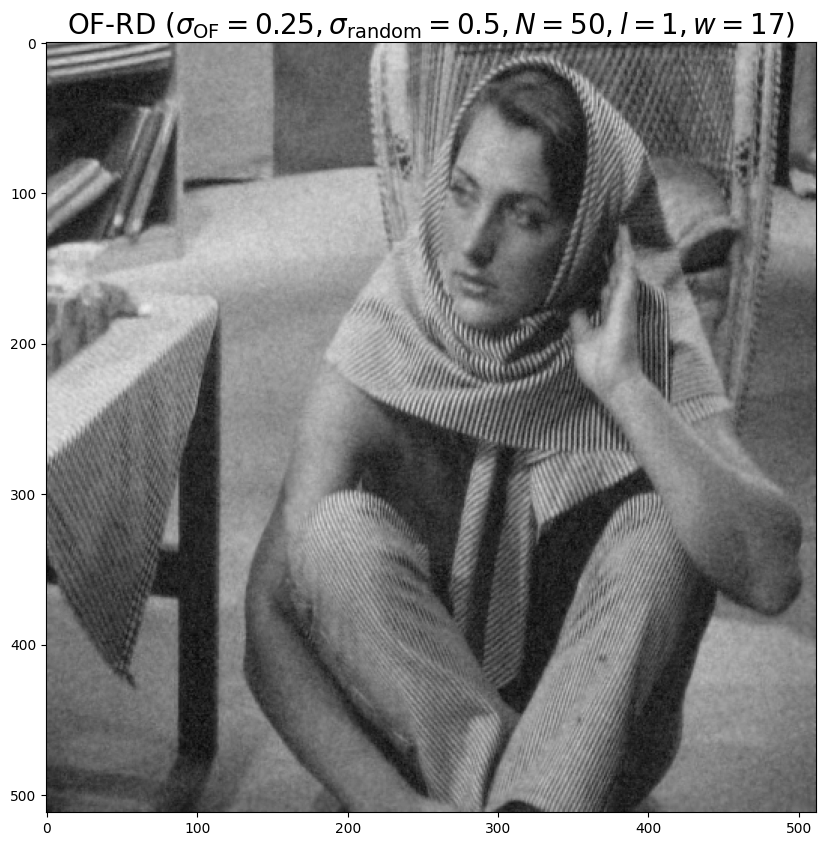

In [54]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [55]:
%%time

OFRD__N_iters = 100
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 17
OFRD__sigma_OF = 0.25

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/100 1/100 2/100 3/100 4/100 5/100 6/100 7/100 8/100 9/100 10/100 11/100 12/100 13/100 14/100 15/100 16/100 17/100 18/100 19/100 20/100 21/100 22/100 23/100 24/100 25/100 26/100 27/100 28/100 29/100 30/100 31/100 32/100 33/100 34/100 35/100 36/100 37/100 38/100 39/100 40/100 41/100 42/100 43/100 44/100 45/100 46/100 47/100 48/100 49/100 50/100 51/100 52/100 53/100 54/100 55/100 56/100 57/100 58/100 59/100 60/100 61/100 62/100 63/100 64/100 65/100 66/100 67/100 68/100 69/100 70/100 71/100 72/100 73/100 74/100 75/100 76/100 77/100 78/100 79/100 80/100 81/100 82/100 83/100 84/100 85/100 86/100 87/100 88/100 89/100 90/100 91/100 92/100 93/100 94/100 95/100 96/100 97/100 98/100 99/100 
CPU times: user 7.39 s, sys: 1.39 s, total: 8.79 s
Wall time: 7.72 s


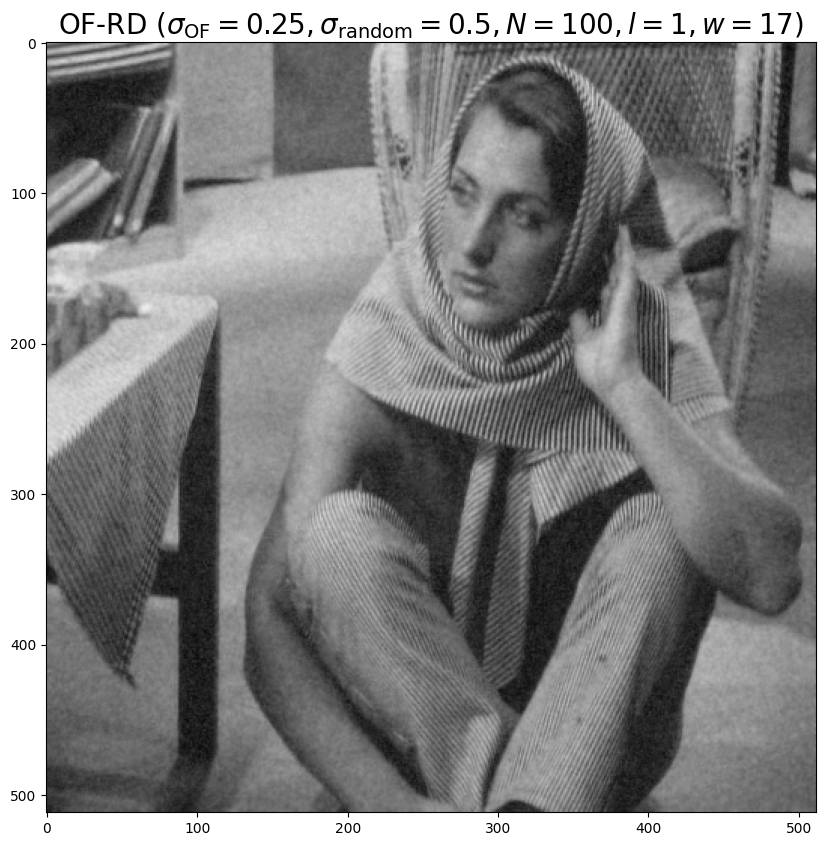

In [56]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [57]:
%%time

OFRD__N_iters = 100
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 17
OFRD__sigma_OF = 0.75

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/100 1/100 2/100 3/100 4/100 5/100 6/100 7/100 8/100 9/100 10/100 11/100 12/100 13/100 14/100 15/100 16/100 17/100 18/100 19/100 20/100 21/100 22/100 23/100 24/100 25/100 26/100 27/100 28/100 29/100 30/100 31/100 32/100 33/100 34/100 35/100 36/100 37/100 38/100 39/100 40/100 41/100 42/100 43/100 44/100 45/100 46/100 47/100 48/100 49/100 50/100 51/100 52/100 53/100 54/100 55/100 56/100 57/100 58/100 59/100 60/100 61/100 62/100 63/100 64/100 65/100 66/100 67/100 68/100 69/100 70/100 71/100 72/100 73/100 74/100 75/100 76/100 77/100 78/100 79/100 80/100 81/100 82/100 83/100 84/100 85/100 86/100 87/100 88/100 89/100 90/100 91/100 92/100 93/100 94/100 95/100 96/100 97/100 98/100 99/100 
CPU times: user 10.7 s, sys: 1.53 s, total: 12.2 s
Wall time: 11.1 s


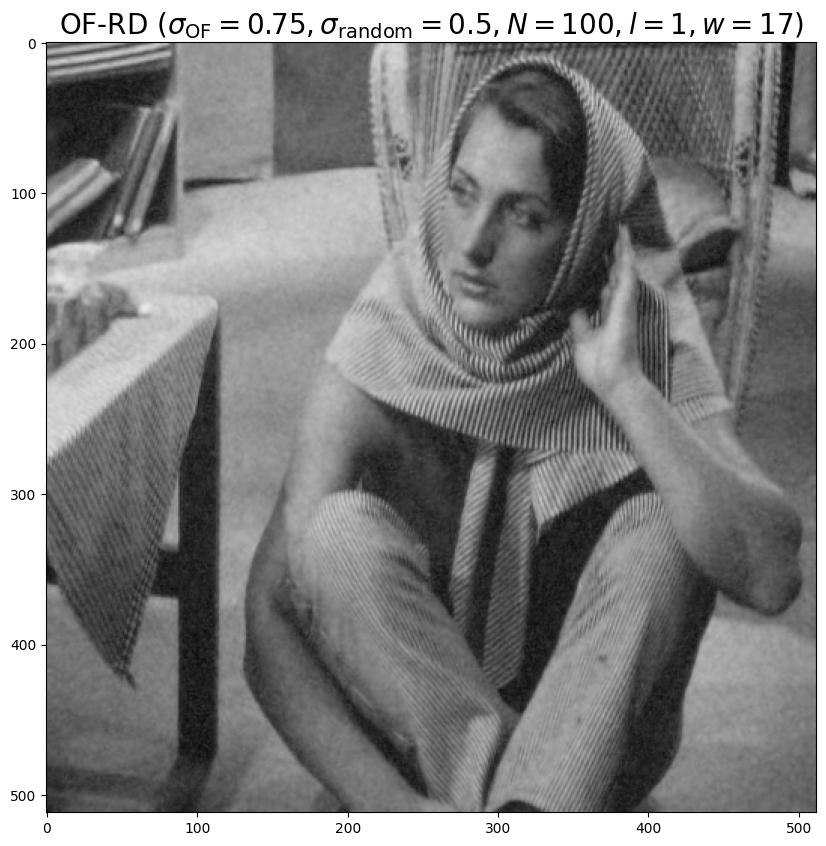

In [58]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [59]:
%%time

OFRD__N_iters = 100
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 17
OFRD__sigma_OF = 0.75

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/100 1/100 2/100 3/100 4/100 5/100 6/100 7/100 8/100 9/100 10/100 11/100 12/100 13/100 14/100 15/100 16/100 17/100 18/100 19/100 20/100 21/100 22/100 23/100 24/100 25/100 26/100 27/100 28/100 29/100 30/100 31/100 32/100 33/100 34/100 35/100 36/100 37/100 38/100 39/100 40/100 41/100 42/100 43/100 44/100 45/100 46/100 47/100 48/100 49/100 50/100 51/100 52/100 53/100 54/100 55/100 56/100 57/100 58/100 59/100 60/100 61/100 62/100 63/100 64/100 65/100 66/100 67/100 68/100 69/100 70/100 71/100 72/100 73/100 74/100 75/100 76/100 77/100 78/100 79/100 80/100 81/100 82/100 83/100 84/100 85/100 86/100 87/100 88/100 89/100 90/100 91/100 92/100 93/100 94/100 95/100 96/100 97/100 98/100 99/100 
CPU times: user 11.8 s, sys: 612 ms, total: 12.5 s
Wall time: 11.4 s


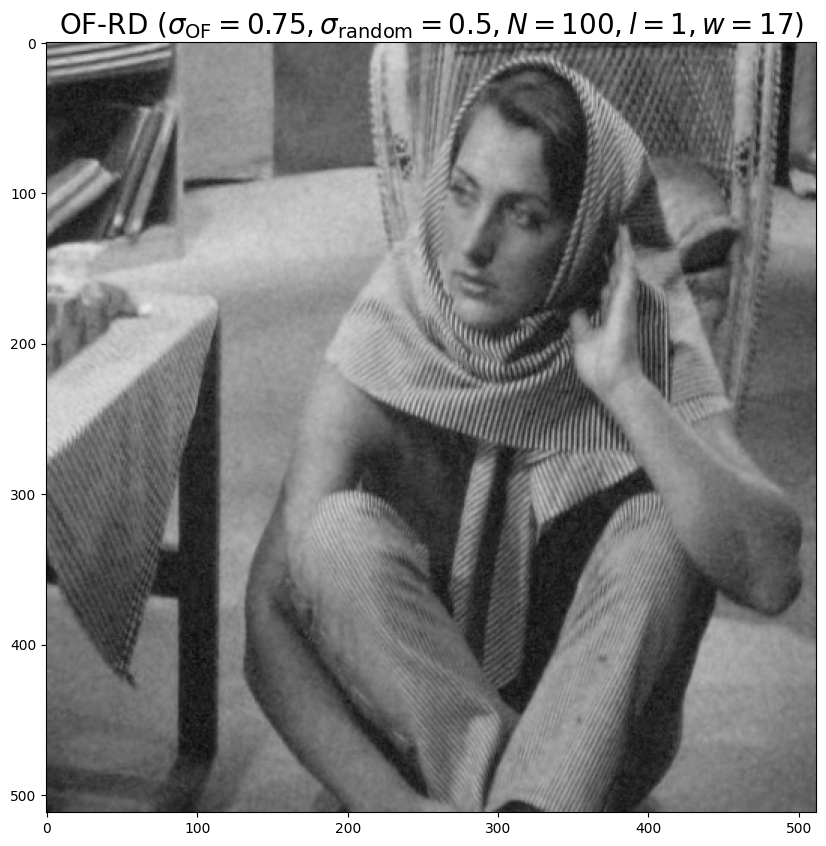

In [60]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [61]:
%%time

OFRD__N_iters = 100
OFRD__sigma_random = 0.5
OFRD__l = 1
OFRD__w = 7
OFRD__sigma_OF = 0.75

denoised, _ = image_denoising.OF_random.filter(
    image_denoising.OF_random.warp_B_to_A,
    noisy_img,
    N_iters=OFRD__N_iters,
    sigma_RD=OFRD__sigma_random,
    l=OFRD__l,
    w=OFRD__w,
    sigma_OF=OFRD__sigma_OF)

0/100 1/100 2/100 3/100 4/100 5/100 6/100 7/100 8/100 9/100 10/100 11/100 12/100 13/100 14/100 15/100 16/100 17/100 18/100 19/100 20/100 21/100 22/100 23/100 24/100 25/100 26/100 27/100 28/100 29/100 30/100 31/100 32/100 33/100 34/100 35/100 36/100 37/100 38/100 39/100 40/100 41/100 42/100 43/100 44/100 45/100 46/100 47/100 48/100 49/100 50/100 51/100 52/100 53/100 54/100 55/100 56/100 57/100 58/100 59/100 60/100 61/100 62/100 63/100 64/100 65/100 66/100 67/100 68/100 69/100 70/100 71/100 72/100 73/100 74/100 75/100 76/100 77/100 78/100 79/100 80/100 81/100 82/100 83/100 84/100 85/100 86/100 87/100 88/100 89/100 90/100 91/100 92/100 93/100 94/100 95/100 96/100 97/100 98/100 99/100 
CPU times: user 10.2 s, sys: 690 ms, total: 10.9 s
Wall time: 9.77 s


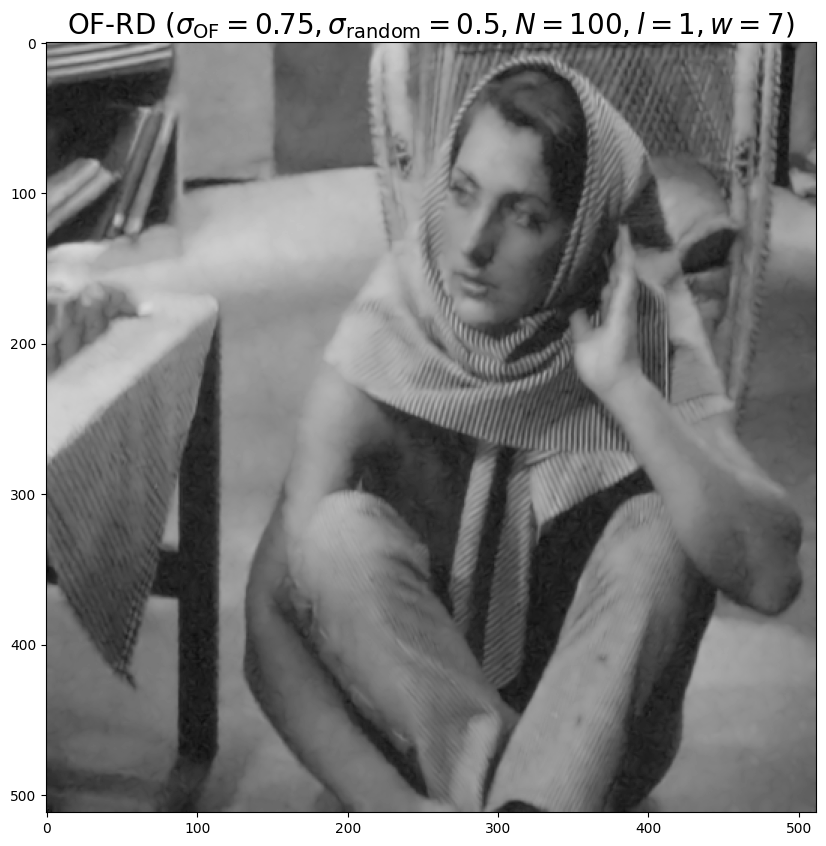

In [62]:
gray_image.show(denoised, "OF-RD " + "($\sigma_\mathrm{OF}=" + f"{OFRD__sigma_OF}, " + "\sigma_\mathrm{random}=" + f"{OFRD__sigma_random}, " + f"N={OFRD__N_iters}, l={OFRD__l}, w={OFRD__w}$)")

In [63]:
input()

KeyboardInterrupt: Interrupted by user

## Old stuff

In [ ]:
denoised_img = _2D_OF_denoising.filter(noisy_img, kernel, l=1, w=33)

In [ ]:
gray_image.show(denoised_img, "denoised")

In [ ]:
print(f"time: {time.process_time()} seconds")

In [ ]:
!pip install mrcfile
import mrcfile

In [ ]:
input_format = "rec"
tomogram_name = "/home/vruiz/Descargas/TS01-wbp"
tomogram_MRC = mrcfile.open(f'{tomogram_name}.{input_format}')
print(f"tomogram_name={tomogram_name} type={tomogram_MRC.data.dtype} shape={tomogram_MRC.data.shape}")
tomogram = tomogram_MRC.data

In [ ]:
denoised_tomogram = _2D_OF_denoising.filter_over_Y(tomogram, kernel, l=2, w=3)

In [ ]:
import matplotlib.pyplot as plt
from ipywidgets import *
import cv2

In [ ]:
def g(z=0):
  #cv2_imshow(cv2.normalize(tomogram[z, :, :][0:200,0:200].astype(np.uint8), None, 0, 255, cv2.NORM_MINMAX))
  #cv2_imshow(cv2.normalize(tomogram[z, :, :].astype(np.uint8), None, 0, 255, cv2.NORM_MINMAX))
  plt.imshow(cv2.normalize(tomogram[z, :, :], None, 0, 255, cv2.NORM_MINMAX))
  plt.imshow(cv2.normalize(denoised_tomogram[z, :, :], None, 0, 255, cv2.NORM_MINMAX))

interactive_plot = interactive(g, z=100)
interactive_plot

In [ ]:
fake_tomogram = np.stack([np.roll(noisy_img,0) for i in range(64)])

In [ ]:
def g(z=0):
  plt.imshow(cv2.normalize(fake_tomogram[:, z, :], None, 0, 255, cv2.NORM_MINMAX))

interactive_plot = interactive(g, z=10)
interactive_plot

In [ ]:
fake_denoised_tomogram = _2D_OF_denoising.filter_over_X(fake_tomogram, kernel, l=2, w=3)

In [ ]:
try:
    import optical_flow as motion
    import display
    import prediction
except:
    !pip install "motion_estimation @ git+https://github.com/vicente-gonzalez-ruiz/motion_estimation"
    from motion_estimation import optical_flow as motion
    from motion_estimation import display
    from motion_estimation import prediction

In [ ]:
initial_MVs = np.zeros((fake_tomogram[:, 0, :].shape[0], fake_tomogram[:, 0, :].shape[1], 2), dtype=np.float32)
MVs = motion.Farneback_ME(predicted=fake_tomogram[:, 10, :], reference=fake_tomogram[:, 15, :], initial_MVs=initial_MVs)

In [ ]:
#display.show_vectors(MVs[::1, ::1])
display.show_vectors(MVs)

In [ ]:
np.max(MVs)

In [ ]:
MVs[32,...]

In [ ]:
initial_MVs = np.zeros((tomogram[:, 0, :].shape[0], tomogram[:, 0, :].shape[1], 2), dtype=np.float32)
MVs = motion.Farneback_ME(predicted=tomogram[:, 1, :], reference=tomogram[:, 2, :], initial_MVs=initial_MVs)

In [ ]:
np.max(MVs)

In [ ]:
tomogram.dtype

In [ ]:
fake_tomogram.dtype

In [ ]:
RGB_image.show(display.colorize(MVs))